# The Battle of the Neighborhoods - Week 2¶

## Download and Explore the data of Newyork city

Processing and Exploring the data set from the available data at the https://geo.nyu.edu/catalog/nyu_2451_34572 where newyork city is having 5 boroughs and 306 neighborhoods. 

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

# notice: installing seaborn might takes a few minutes
!conda install -c anaconda seaborn -y
import seaborn as sns

import csv # implements classes to read and write tabular data in CSV form

print('Libraries imported.')


# import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS

print ('Wordcloud is installed and imported!')

Solving environment: done

# All requested packages already installed.

Solving environment: done

# All requested packages already installed.

Libraries imported.


In [2]:
!wget -q -O 'newyork_data.json' https://ibm.box.com/shared/static/fbpwbovar7lf8p5sgddm06cgipa2rxpe.json
print('Data downloaded!')

Data downloaded!


Load the data and check for the available abd possible values.

In [3]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Include the data as Features from the JSON file and check for the sample value

In [4]:
neighborhoods_data = newyork_data['features']
neighborhoods_data[0]

{'type': 'Feature',
 'id': 'nyu_2451_34572.1',
 'geometry': {'type': 'Point',
  'coordinates': [-73.84720052054902, 40.89470517661]},
 'geometry_name': 'geom',
 'properties': {'name': 'Wakefield',
  'stacked': 1,
  'annoline1': 'Wakefield',
  'annoline2': None,
  'annoline3': None,
  'annoangle': 0.0,
  'borough': 'Bronx',
  'bbox': [-73.84720052054902,
   40.89470517661,
   -73.84720052054902,
   40.89470517661]}}

**DATA TRANSFORMATION USING PANDAS TO PLACE IN TABULAR FORMAT**

In [5]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


**Check for the total values for the further data processing**

In [6]:

print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [7]:
#export the data for the further use
neighborhoods.to_csv('BON1_NYC_GEO.csv',index=False)

**Place the data in the maps**

In [8]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [9]:
# create map of New York using latitude and longitude values
map_NewYork = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Borough'], neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_NewYork)  
    
map_NewYork

## Further Step-2 will be used now to populate and process the data from the Wikipedia File## 

Importing and scrapping data from  https://en.wikipedia.org/wiki/New_York_City

In [21]:
from bs4 import BeautifulSoup # package for parsing HTML and XML documents

import csv # implements classes to read and write tabular data in CSV form


website_url = requests.get('https://en.wikipedia.org/wiki/Demographics_of_New_York_City').text
soup = BeautifulSoup(website_url,'lxml')
table = soup.find('table',{'class':'wikitable sortable'})
#print(soup.prettify())

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('BON2_POPULATION1.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

In [11]:
Pop_data=pd.read_csv('BON2_POPULATION1.csv')
Pop_data
Pop_data.drop(Pop_data.columns[[8,9,10,11,12,13,14]], axis=1,inplace=True)
print('Data downloaded!')
Pop_data


Data downloaded!


,New York City's five boroughsvte,Jurisdiction,Population,Gross Domestic Product,Land area,Density,Borough,County
0,The Bronx\n,\n Bronx\n,"1,432,132\n",42.695\n,"29,200\n",42.10\n,109.04\n,"34,653\n"
1,Brooklyn\n,\n Kings\n,"2,582,830\n",91.559\n,"34,600\n",70.82\n,183.42\n,"37,137\n"
2,Manhattan\n,\n New York\n,"1,628,701\n",600.244\n,"360,900\n",22.83\n,59.13\n,"72,033\n"
3,Queens\n,\n Queens\n,"2,278,906\n",93.310\n,"39,600\n",108.53\n,281.09\n,"21,460\n"
4,Staten Island\n,\n Richmond\n,"476,179\n",14.514\n,"30,300\n",58.37\n,151.18\n,"8,112\n"
5,City of New York,"8,398,748",842.343,"97,700",302.64,783.83,"28,188","10,947\n"
6,State of New York,"19,745,289","1,701.399","85,700","47,214","122,284",416.4,159\n
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
Pop_data.columns = Pop_data.columns.str.replace(' ', '')
Pop_data.columns = Pop_data.columns.str.replace('\'','')
Pop_data.rename(columns={'Borough':'persons_sq_mi','County':'persons_sq_km'}, inplace=True)
Pop_data

,NewYorkCitysfiveboroughsvte,Jurisdiction,Population,GrossDomesticProduct,Landarea,Density,persons_sq_mi,persons_sq_km
0,The Bronx\n,\n Bronx\n,"1,432,132\n",42.695\n,"29,200\n",42.10\n,109.04\n,"34,653\n"
1,Brooklyn\n,\n Kings\n,"2,582,830\n",91.559\n,"34,600\n",70.82\n,183.42\n,"37,137\n"
2,Manhattan\n,\n New York\n,"1,628,701\n",600.244\n,"360,900\n",22.83\n,59.13\n,"72,033\n"
3,Queens\n,\n Queens\n,"2,278,906\n",93.310\n,"39,600\n",108.53\n,281.09\n,"21,460\n"
4,Staten Island\n,\n Richmond\n,"476,179\n",14.514\n,"30,300\n",58.37\n,151.18\n,"8,112\n"
5,City of New York,"8,398,748",842.343,"97,700",302.64,783.83,"28,188","10,947\n"
6,State of New York,"19,745,289","1,701.399","85,700","47,214","122,284",416.4,159\n
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Cleansing of the data

In [13]:
Pop_data.rename(columns = {'NewYorkCitysfiveboroughsvte\n' : 'Borough',
                   'Jurisdiction\n':'County',
                   'Population\n':'Estimate_2017', 
                   'Landarea\n':'square_miles',
                    'Density\n':'square_km'}, inplace=True)

Pop_data

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,persons_sq_km
0,The Bronx\n,\n Bronx\n,"1,432,132\n",42.695\n,"29,200\n",42.10\n,109.04\n,"34,653\n"
1,Brooklyn\n,\n Kings\n,"2,582,830\n",91.559\n,"34,600\n",70.82\n,183.42\n,"37,137\n"
2,Manhattan\n,\n New York\n,"1,628,701\n",600.244\n,"360,900\n",22.83\n,59.13\n,"72,033\n"
3,Queens\n,\n Queens\n,"2,278,906\n",93.310\n,"39,600\n",108.53\n,281.09\n,"21,460\n"
4,Staten Island\n,\n Richmond\n,"476,179\n",14.514\n,"30,300\n",58.37\n,151.18\n,"8,112\n"
5,City of New York,"8,398,748",842.343,"97,700",302.64,783.83,"28,188","10,947\n"
6,State of New York,"19,745,289","1,701.399","85,700","47,214","122,284",416.4,159\n
7,Sources:[14] and see individual borough articl...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
Pop_data['Borough']=Pop_data['Borough'].replace(to_replace='\n', value='', regex=True)
Pop_data['County']=Pop_data['County'].replace(to_replace='\n', value='', regex=True)
Pop_data['Estimate_2017']=Pop_data['Estimate_2017'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_miles']=Pop_data['square_miles'].replace(to_replace='\n', value='', regex=True)
Pop_data['square_km']=Pop_data['square_km'].replace(to_replace='\n', value='', regex=True)
Pop_data['persons_sq_mi']=Pop_data['persons_sq_mi'].replace(to_replace='\n', value='', regex=True)
Pop_data['persons_sq_km']=Pop_data['persons_sq_km'].replace(to_replace='\n', value='', regex=True)
Pop_data

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,persons_sq_km
0,The Bronx,Bronx,"1,432,132",42.695\n,"29,200",42.10,109.04,"34,653"
1,Brooklyn,Kings,"2,582,830",91.559\n,"34,600",70.82,183.42,"37,137"
2,Manhattan,New York,"1,628,701",600.244\n,"360,900",22.83,59.13,"72,033"
3,Queens,Queens,"2,278,906",93.310\n,"39,600",108.53,281.09,"21,460"
4,Staten Island,Richmond,"476,179",14.514\n,"30,300",58.37,151.18,"8,112"
5,City of New York,"8,398,748",842.343,"97,700",302.64,783.83,"28,188","10,947"
6,State of New York,"19,745,289","1,701.399","85,700","47,214","122,284",416.4,159
7,Sources:[14] and see individual borough articles,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
Pop_data.loc[5:,['persons_sq_mi','persons_sq_km']] = Pop_data.loc[2:,['persons_sq_mi','persons_sq_km']].shift(1,axis=1)
Pop_data.loc[5:,['square_km','persons_sq_mi']] = Pop_data.loc[2:,['square_km','persons_sq_mi']].shift(1,axis=1)
Pop_data.loc[5:,['square_miles','square_km']] = Pop_data.loc[2:,['square_miles','square_km']].shift(1,axis=1)
Pop_data.loc[5:,['Estimate_2017','square_miles']] = Pop_data.loc[2:,['Estimate_2017','square_miles']].shift(1,axis=1)
Pop_data.loc[5:,['County','Estimate_2017']] = Pop_data.loc[2:,['County','Estimate_2017']].shift(1,axis=1)
Pop_data.loc[5:,['Borough','County']] = Pop_data.loc[2:,['Borough','County']].shift(1,axis=1)
Pop_data

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,persons_sq_km
0,The Bronx,Bronx,"1,432,132",42.695\n,"29,200",42.10,109.04,"34,653"
1,Brooklyn,Kings,"2,582,830",91.559\n,"34,600",70.82,183.42,"37,137"
2,Manhattan,New York,"1,628,701",600.244\n,"360,900",22.83,59.13,"72,033"
3,Queens,Queens,"2,278,906",93.310\n,"39,600",108.53,281.09,"21,460"
4,Staten Island,Richmond,"476,179",14.514\n,"30,300",58.37,151.18,"8,112"
5,NaN,City of New York,"8,398,748","97,700",842.343,302.64,783.83,"28,188"
6,NaN,State of New York,"19,745,289","85,700","1,701.399","47,214","122,284",416.4
7,NaN,Sources:[14] and see individual borough articles,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
Pop_data = Pop_data.fillna('')
Pop_data

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,persons_sq_km
0,The Bronx,Bronx,"1,432,132",42.695\n,"29,200",42.10,109.04,"34,653"
1,Brooklyn,Kings,"2,582,830",91.559\n,"34,600",70.82,183.42,"37,137"
2,Manhattan,New York,"1,628,701",600.244\n,"360,900",22.83,59.13,"72,033"
3,Queens,Queens,"2,278,906",93.310\n,"39,600",108.53,281.09,"21,460"
4,Staten Island,Richmond,"476,179",14.514\n,"30,300",58.37,151.18,"8,112"
5,,City of New York,"8,398,748","97,700",842.343,302.64,783.83,"28,188"
6,,State of New York,"19,745,289","85,700","1,701.399","47,214","122,284",416.4
7,,Sources:[14] and see individual borough articles,,,,,,


In [17]:
i = Pop_data[((Pop_data.County == 'Sources:[14] and see individual borough articles'))].index
Pop_data.drop(i)

,Borough,County,Estimate_2017,GrossDomesticProduct,square_miles,square_km,persons_sq_mi,persons_sq_km
0,The Bronx,Bronx,"1,432,132",42.695\n,"29,200",42.10,109.04,"34,653"
1,Brooklyn,Kings,"2,582,830",91.559\n,"34,600",70.82,183.42,"37,137"
2,Manhattan,New York,"1,628,701",600.244\n,"360,900",22.83,59.13,"72,033"
3,Queens,Queens,"2,278,906",93.310\n,"39,600",108.53,281.09,"21,460"
4,Staten Island,Richmond,"476,179",14.514\n,"30,300",58.37,151.18,"8,112"
5,,City of New York,"8,398,748","97,700",842.343,302.64,783.83,"28,188"
6,,State of New York,"19,745,289","85,700","1,701.399","47,214","122,284",416.4


In [18]:
Pop_data.to_csv('BON2_POPULATION.csv',index=False)

### We will web scrap Demographics data from wikipedia page - https://en.wikipedia.org/wiki/New_York_City

In [73]:
website_url = requests.get('https://en.wikipedia.org/wiki/New_York_City').text
soup = BeautifulSoup(website_url,'lxml')
table = soup.find_all('table',{'class':'wikitable collapsible collapsed'},{'style':'font-size: 90%;'})[1]

headers = [header.text for header in table.find_all('th')]

table_rows = table.find_all('tr')        
rows = []
for row in table_rows:
   td = row.find_all('td')
   row = [row.text for row in td]
   rows.append(row)

with open('NYC_DEMO.csv', 'w') as f:
   writer = csv.writer(f)
   writer.writerow(headers)
   writer.writerows(row for row in rows if row)

In [74]:
Demo_data=pd.read_csv('NYC_DEMO.csv')
print('Data downloaded!')

Data downloaded!


In [75]:
Demo_data

,Racial composition,2010[233],1990[235],1970[235],1940[235]
0,White,44.0%,52.3%,76.6%,93.6%\n
1,—Non-Hispanic,33.3%,43.2%,62.9%[236],92.0%\n
2,Black or African American,25.5%,28.7%,21.1%,6.1%\n
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%[236],1.6%\n
4,Asian,12.7%,7.0%,1.2%,–\n


**CLEANS THE DATA**

In [76]:
Demo_data.columns

Index(['Racial composition', '2010[233]', '1990[235]', '1970[235]',
       '1940[235]\n'],
      dtype='object')

In [84]:
Demo_data.rename(columns = {'2010[233]' : '2010',
                   '1990[235]':'1990',
                   '1970[235]':'1970', 
                   '1940[235]\n':'1940',
                    }, inplace=True)
Demo_data

,Racialcomposition,2010,1990,1970,1940
0,White,44.0%,52.3%,76.6%,93.6%
1,—Non-Hispanic,33.3%,43.2%,62.9%[236],92.0%
2,Black or African American,25.5%,28.7%,21.1%,6.1%
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%[236],1.6%
4,Asian,12.7%,7.0%,1.2%,–


In [85]:
Demo_data.columns


Index(['Racialcomposition', '2010', '1990', '1970', '1940'], dtype='object')

In [86]:
Demo_data.columns = Demo_data.columns.str.replace(' ', '')
Demo_data= Demo_data.replace('\n',' ', regex=True)
Demo_data

,Racialcomposition,2010,1990,1970,1940
0,White,44.0%,52.3%,76.6%,93.6%
1,—Non-Hispanic,33.3%,43.2%,62.9%[236],92.0%
2,Black or African American,25.5%,28.7%,21.1%,6.1%
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%[236],1.6%
4,Asian,12.7%,7.0%,1.2%,–


In [87]:
Demo_data['1970'] = Demo_data['1970'].str.rstrip('[236]')
Demo_data

,Racialcomposition,2010,1990,1970,1940
0,White,44.0%,52.3%,76.6%,93.6%
1,—Non-Hispanic,33.3%,43.2%,62.9%,92.0%
2,Black or African American,25.5%,28.7%,21.1%,6.1%
3,Hispanic or Latino (of any race),28.6%,24.4%,16.2%,1.6%
4,Asian,12.7%,7.0%,1.2%,–


In [88]:
Demo_data.to_csv('BON2_DEMOGRAPHICS.csv',index=False)

## Part 3 Download and Explore New York city and its Boroughs Cuisine dataset

In [89]:
#Download and check all libraries

import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
from PIL import Image # converting images into arrays

%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

# install wordcloud
!conda install -c conda-forge wordcloud==1.4.1 --yes

# import package and its set of stopwords
from wordcloud import WordCloud, STOPWORDS

print ('Wordcloud is installed and imported!')

Matplotlib version:  3.0.2
Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - wordcloud==1.4.1


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    wordcloud-1.4.1            |           py36_0         324 KB  conda-forge

The following NEW packages will be INSTALLED:

    wordcloud: 1.4.1-py36_0 conda-forge


wordcloud-1.4.1      | 324 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Wordcloud is installed and imported!


This data is extracted from the wikipedia Page - https://en.wikipedia.org/wiki/Cuisine_of_New_York_City

In [104]:
from bs4 import BeautifulSoup # package for parsing HTML and XML documents

import csv # implements classes to read and write tabular data in CSV form


website_url = requests.get('https://en.wikipedia.org/wiki/Cuisine_of_New_York_City').text
soup = BeautifulSoup(website_url,'lxml')
soup

column_names = ['Borough','Neighborhood','Cuisine']

NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'City Island','Cuisine': 'Italian, Seafood'},ignore_index=True)
NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'Morris Park','Cuisine': 'Italian, Albanian'},ignore_index=True)
NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'Norwood','Cuisine': 'Filipino (formerly Irish, less so today)'},ignore_index=True)
NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'Riverdale','Cuisine': 'Jewish'},ignore_index=True)
NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'South Bronx','Cuisine': 'Puerto Rican, Dominican'},ignore_index=True)
NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'Wakefield ','Cuisine': 'Jamaican, West Indian'},ignore_index=True)
NYC_CUISINE = NYC_CUISINE.append({'Borough': 'The Bronx','Neighborhood': 'Woodlawn ','Cuisine': 'Irish'},ignore_index=True)
NYC_CUISINE

,Borough,Neighborhood,Cuisine
0,The Bronx,Bedford Park,"Mexican, Puerto Rican, Dominican, Korean (on 2..."
1,The Bronx,Belmont,"Italian, Albanian (also known as ""Arthur Avenu..."
2,The Bronx,City Island,"Italian, Seafood"
3,The Bronx,Morris Park,"Italian, Albanian"
4,The Bronx,Norwood,"Filipino (formerly Irish, less so today)"
5,The Bronx,Riverdale,Jewish
6,The Bronx,South Bronx,"Puerto Rican, Dominican"
7,The Bronx,Wakefield,"Jamaican, West Indian"
8,The Bronx,Woodlawn,Irish


In [105]:
CUISINE_WC = NYC_CUISINE[['Cuisine']]
CUISINE_WC

,Cuisine
0,"Mexican, Puerto Rican, Dominican, Korean (on 2..."
1,"Italian, Albanian (also known as ""Arthur Avenu..."
2,"Italian, Seafood"
3,"Italian, Albanian"
4,"Filipino (formerly Irish, less so today)"
5,Jewish
6,"Puerto Rican, Dominican"
7,"Jamaican, West Indian"
8,Irish


In [108]:
CUISINE_WC.to_csv('CUISINE_WC.txt', sep=',', index=False)
CUISINE_WC1 = open('CUISINE_WC.txt', 'r').read()
stopwords = set(STOPWORDS)


In [109]:
# instantiate a word cloud object
NYC_CUISINE_WC = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords
)

# generate the word cloud
NYC_CUISINE_WC.generate(CUISINE_WC1)

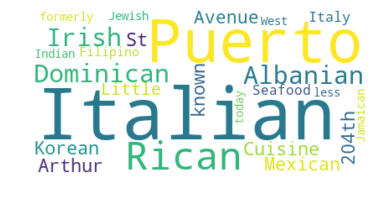

<Figure size 2160x3240 with 0 Axes>

In [110]:
# display the word cloud
plt.imshow(NYC_CUISINE_WC, interpolation='bilinear')
plt.axis('off')

fig = plt.figure()
fig.set_figwidth(30)
fig.set_figheight(45)

plt.show()

In [112]:
Brooklyn_data = NYC_CUISINE[NYC_CUISINE['Borough'] == 'The Bronx'].reset_index(drop=True)
Brooklyn_data.head()

,Borough,Neighborhood,Cuisine
0,The Bronx,Bedford Park,"Mexican, Puerto Rican, Dominican, Korean (on 2..."
1,The Bronx,Belmont,"Italian, Albanian (also known as ""Arthur Avenu..."
2,The Bronx,City Island,"Italian, Seafood"
3,The Bronx,Morris Park,"Italian, Albanian"
4,The Bronx,Norwood,"Filipino (formerly Irish, less so today)"


In [113]:
BR_CUISINE_WC = Brooklyn_data[['Cuisine']]
BR_CUISINE_WC

,Cuisine
0,"Mexican, Puerto Rican, Dominican, Korean (on 2..."
1,"Italian, Albanian (also known as ""Arthur Avenu..."
2,"Italian, Seafood"
3,"Italian, Albanian"
4,"Filipino (formerly Irish, less so today)"
5,Jewish
6,"Puerto Rican, Dominican"
7,"Jamaican, West Indian"
8,Irish


In [149]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.ticker import NullFormatter
import matplotlib.ticker as ticker

# notice: installing seaborn might takes a few minutes
!conda install -c anaconda seaborn -y
import seaborn as sns

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

# All requested packages already installed.

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - seaborn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2020.1.1   |                0         132 KB  anaconda
    openssl-1.1.1              |       h7b6447c_0         5.0 MB  anaconda
    seaborn-0.10.0             |             py_0         161 KB  anaconda
    certifi-2020.4.5.1         |           py36_0         159 KB  anaconda
    ------------------------------------------------------------
                                           Total:         5.5 MB

The following packages will be UPDATED:

    certifi:         2020.4.5.1-py36h9f0ad1d_0 conda-forge --> 2020.4.5.1-py36_0 anaconda
    openssl:         1.1.1f-h516909a_0         conda-forge --> 1.1.1-h7b6447c_0  an

## Explore the farmers Market Data Set

In [152]:

import types
import pandas as pd
from botocore.client import Config
import ibm_boto3

def __iter__(self): return 0

# @hidden_cell
# The following code accesses a file in your IBM Cloud Object Storage. It includes your credentials.
# You might want to remove those credentials before you share the notebook.
client_165a2e869ce84b0c860738f04bed56be = ibm_boto3.client(service_name='s3',
    ibm_api_key_id='_P_J9bjDCHSdGjdnWMCjzwEYdgi2Ge2vwveM_PCN8_A4',
    ibm_auth_endpoint="https://iam.eu-gb.bluemix.net/oidc/token",
    config=Config(signature_version='oauth'),
    endpoint_url='https://s3.eu-geo.objectstorage.service.networklayer.com')

body = client_165a2e869ce84b0c860738f04bed56be.get_object(Bucket='capstonfinalproject-donotdelete-pr-aripcpmtwd3keb',Key='DOHMH_Farmers_Markets.csv')['Body']
# add missing __iter__ method, so pandas accepts body as file-like object
if not hasattr(body, "__iter__"): body.__iter__ = types.MethodType( __iter__, body )

df_data_1 = pd.read_csv(body)
FM_NYC=df_data_1
FM_NYC.head()


,Borough,Market Name,Street Address,Latitude,Longitude,Days of Operation,Hours of Operations,Season Dates,Accepts EBT,Open Year-Round,Stellar Cooking Demonstrations,Food Activities for Kids,Location Point
0,Brooklyn,Woodhull Hospital Youthmarket,Broadway & Flushing Ave,40.700726,-73.941932,Wednesday,9 a.m. - 2 p.m.,07/10/2019-11/27/2019,Yes,No,No,No,"(40.700726, -73.941932)"
1,Manhattan,Mount Sinai Hospital Greenmarket,E 99th St bet Madison & Park Aves,40.789169,-73.952743,Wednesday,8 a.m. - 5 p.m.,06/12/19-11/27/19,Yes,No,No,No,"(40.789169, -73.952743)"
2,Bronx,170 Farm Stand,E 170th St & Townsend Ave,40.839882,-73.916783,Wednesday,2:30 - 6:30 p.m.,07/10/2019-11/27/2019,Yes,No,No,Yes,"(40.839882, -73.916783)"
3,Manhattan,Greenmarket at Oculus Plaza,"Church & Fulton Sts, on Oculus Plaza",40.711535,-74.010464,Tuesday,7 a.m. - 7 p.m.,07/09/2019-11/30/19,Yes,Yes,No,No,"(40.711535, -74.010464)"
4,Queens,Ditmars Park Youthmarket,"Steinway St bet Ditmars Blvd & 23rd Ave, at Di...",40.772854,-73.906061,Saturday,8 a.m. - 3 p.m.,07/13/2019-11/23/2019,Yes,No,No,No,"(40.772854, -73.906061)"


In [153]:
# FM_NYC_filtered - Dataset with only Farmers Market
FM_NYC_filtered=FM_NYC
FM_NYC_filtered ['Borough'] = FM_NYC_filtered['Borough'].map(lambda x: x.strip())
print(FM_NYC_filtered.shape)
FM_NYC_filtered.head()

(138, 13)


,Borough,Market Name,Street Address,Latitude,Longitude,Days of Operation,Hours of Operations,Season Dates,Accepts EBT,Open Year-Round,Stellar Cooking Demonstrations,Food Activities for Kids,Location Point
0,Brooklyn,Woodhull Hospital Youthmarket,Broadway & Flushing Ave,40.700726,-73.941932,Wednesday,9 a.m. - 2 p.m.,07/10/2019-11/27/2019,Yes,No,No,No,"(40.700726, -73.941932)"
1,Manhattan,Mount Sinai Hospital Greenmarket,E 99th St bet Madison & Park Aves,40.789169,-73.952743,Wednesday,8 a.m. - 5 p.m.,06/12/19-11/27/19,Yes,No,No,No,"(40.789169, -73.952743)"
2,Bronx,170 Farm Stand,E 170th St & Townsend Ave,40.839882,-73.916783,Wednesday,2:30 - 6:30 p.m.,07/10/2019-11/27/2019,Yes,No,No,Yes,"(40.839882, -73.916783)"
3,Manhattan,Greenmarket at Oculus Plaza,"Church & Fulton Sts, on Oculus Plaza",40.711535,-74.010464,Tuesday,7 a.m. - 7 p.m.,07/09/2019-11/30/19,Yes,Yes,No,No,"(40.711535, -74.010464)"
4,Queens,Ditmars Park Youthmarket,"Steinway St bet Ditmars Blvd & 23rd Ave, at Di...",40.772854,-73.906061,Saturday,8 a.m. - 3 p.m.,07/13/2019-11/23/2019,Yes,No,No,No,"(40.772854, -73.906061)"


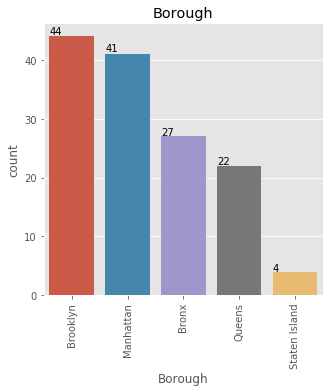

In [154]:
fig,ax = plt.subplots(1, 1, figsize=(5, 5))
sns.countplot(x='Borough',data=FM_NYC_filtered)
ax.set_title("Borough")
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate('', (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))
        ax.set_xticklabels([t.get_text().split("T")[0] for t in ax.get_xticklabels()])

# This sets the yticks "upright" with 0, as opposed to sideways with 90.
plt.xticks(rotation=90) 
plt.show()

**Use geopy library to get the latitude and longitude values of New York City**

In [155]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


### Create a map of New York with Facility name and Borough of Farmers Market superimposed on top.¶


In [157]:

# create map of New York City using latitude and longitude values
map_markets = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, FacilityName, borough in zip(FM_NYC_filtered['Latitude'], FM_NYC_filtered['Longitude'], FM_NYC_filtered['Market Name'], FM_NYC_filtered['Borough']):
            label = '{}, {}'.format(FacilityName, borough)
            label = folium.Popup(label, parse_html=True)
            folium.CircleMarker(
                [lat, lng],
                radius=5,
                popup=label,
                color='green',
                fill=True,
                fill_color='green',
                fill_opacity=0.7,
                parse_html = False).add_to(map_markets)  

map_markets

# Segmenting and Clustering Neighborhoods 

In [158]:
NYC_Geo=pd.read_csv('BON1_NYC_GEO.csv')
print('Data downloaded!')

Data downloaded!


In [159]:
NYC_Geo.head()


,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [160]:
NYC_Geo['Borough'].value_counts().to_frame()


,Borough
Queens,81
Brooklyn,70
Staten Island,63
Bronx,52
Manhattan,40


In [161]:
BM_Geo = NYC_Geo.loc[(NYC_Geo['Borough'] == 'Brooklyn')|(NYC_Geo['Borough'] == 'Manhattan')]
BM_Geo = BM_Geo.reset_index(drop=True)
BM_Geo.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Marble Hill,40.876551,-73.910660
1,Brooklyn,Bay Ridge,40.625801,-74.030621
2,Brooklyn,Bensonhurst,40.611009,-73.995180
3,Brooklyn,Sunset Park,40.645103,-74.010316
4,Brooklyn,Greenpoint,40.730201,-73.954241


In [162]:
import time
start_time = time.time()

address = 'New York City, NY'

geolocator = Nominatim(user_agent="Jupyter")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

print("--- %s seconds ---" % round((time.time() - start_time), 2))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.
--- 0.37 seconds ---


In [163]:

# create map of Toronto using latitude and longitude values
map_BM = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(BM_Geo['Latitude'], BM_Geo['Longitude'], BM_Geo['Borough'], BM_Geo['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_BM)  
    
map_BM

In [164]:
CLIENT_ID = 'OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL' # your Foursquare ID
CLIENT_SECRET = 'VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T' # your Foursquare Secret
VERSION = '20181218' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: OLN1BAQQBHO234LKFIU1ZNGV4Z3O3P1GS5KIMTNPJHLX1MKL
CLIENT_SECRET:VDM5CGGVSUOGKMY21ETO4J1UAJH5QJEALQCJAIWUF2DJXR2T


# Explore Neighborhoods in Brooklyn and Manhattan¶


In [165]:
def getNearbyVenues(names, latitudes, longitudes, LIMIT=200, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [166]:
BM_venues = getNearbyVenues(names=BM_Geo['Neighborhood'],
                                  latitudes=BM_Geo['Latitude'],
                                  longitudes=BM_Geo['Longitude'],
                                  LIMIT=200)

print('The "BM_venues" dataframe has {} venues and {} unique venue types.'.format(
      len(BM_venues['Venue Category']),
      len(BM_venues['Venue Category'].unique())))

BM_venues.to_csv('BM_venues.csv', sep=',', encoding='UTF8')
BM_venues.head()

Marble Hill
Bay Ridge
Bensonhurst
Sunset Park
Greenpoint
Gravesend
Brighton Beach
Sheepshead Bay
Manhattan Terrace
Flatbush
Crown Heights
East Flatbush
Kensington
Windsor Terrace
Prospect Heights
Brownsville
Williamsburg
Bushwick
Bedford Stuyvesant
Brooklyn Heights
Cobble Hill
Carroll Gardens
Red Hook
Gowanus
Fort Greene
Park Slope
Cypress Hills
East New York
Starrett City
Canarsie
Flatlands
Mill Island
Manhattan Beach
Coney Island
Bath Beach
Borough Park
Dyker Heights
Gerritsen Beach
Marine Park
Clinton Hill
Sea Gate
Downtown
Boerum Hill
Prospect Lefferts Gardens
Ocean Hill
City Line
Bergen Beach
Midwood
Prospect Park South
Georgetown
East Williamsburg
North Side
South Side
Ocean Parkway
Fort Hamilton
Chinatown
Washington Heights
Inwood
Hamilton Heights
Manhattanville
Central Harlem
East Harlem
Upper East Side
Yorkville
Lenox Hill
Roosevelt Island
Upper West Side
Lincoln Square
Clinton
Midtown
Murray Hill
Chelsea
Greenwich Village
East Village
Lower East Side
Tribeca
Little Italy
Soho

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [167]:
colnames = ['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Latitude', 'Venue Longitude', 'Venue Category']
BM_venues = pd.read_csv('BM_venues.csv', skiprows=1, names=colnames)
BM_venues.columns = BM_venues.columns.str.replace(' ', '')
BM_venues.head()

,Neighborhood,NeighborhoodLatitude,NeighborhoodLongitude,Venue,VenueLatitude,VenueLongitude,VenueCategory
0,Marble Hill,40.876551,-73.91066,Bikram Yoga,40.876844,-73.906204,Yoga Studio
1,Marble Hill,40.876551,-73.91066,Arturo's,40.874412,-73.910271,Pizza Place
2,Marble Hill,40.876551,-73.91066,Tibbett Diner,40.880404,-73.908937,Diner
3,Marble Hill,40.876551,-73.91066,Sam's Pizza,40.879435,-73.905859,Pizza Place
4,Marble Hill,40.876551,-73.91066,Starbucks,40.877531,-73.905582,Coffee Shop


In [168]:
BM_venues.shape


(9638, 7)

In [169]:
def Venues_Map(Borough_name, Borough_neighborhoods):
    
    # Use geopy library to get the latitude and longitude values 
    geolocator = Nominatim(user_agent="Jupyter")
    Borough_location = geolocator.geocode(Borough_name) #'Brooklyn, NY'
    Borough_latitude = Borough_location.latitude
    Borough_longitude = Borough_location.longitude
    print('The geographical coordinates of "{}" are {}, {}.'.format(Borough_name, Borough_latitude, Borough_longitude))
    
    # To verify the number of Boroughs and Neighborhoods in the extracted data
    print('The "{}" dataframe has {} different venue types and {} neighborhoods.'.format(
          Borough_name,
          len(Borough_neighborhoods['VenueCategory'].unique()),
          len(Borough_neighborhoods['Neighborhood'].unique())))
    
    # create map of city using latitude and longitude values
    map_Borough = folium.Map(location=[Borough_latitude, Borough_longitude], zoom_start=10)

    # add markers to map
    for lat, lng, venue, category in zip(Borough_neighborhoods['VenueLatitude'], Borough_neighborhoods['VenueLongitude'], Borough_neighborhoods['Venue'], Borough_neighborhoods['VenueCategory']):
        label = '{}, {}'.format(category, venue)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=0.1,
            popup=label,
            color='red',
            fill=True,
            fill_color='#FF0000',
            fill_opacity=0.3).add_to(map_Borough)  

    return map_Borough

In [170]:
Venues_Map('New York City, NY', BM_venues)

The geographical coordinates of "New York City, NY" are 40.7127281, -74.0060152.
The "New York City, NY" dataframe has 411 different venue types and 110 neighborhoods.
